# Object Detection with Icevision 
> A tutorial for object detection with Icevision library.

- toc: true 
- badges: true
- comments: true
- categories: [jupyter]

#What is Icevision ? 
>Icevision is a framework agnostic object detection library that enables us to train our models with just a few lines using fastai or pytorch lightning.Icevision makes training mmdetection,torchvision and efficientdet models extremely easy.All we need to do is change a couple lines.Let's get started.

#Installation
>We start by installing Icevision.Installing Icevision is pretty easy,all we need to do is run the cell below.Beware that we are running on colab using gpu.If you are on your local machine and need to use cpu,change the below line from cuda to cpu.Icevision only supports Linux and MAC at the moment(via installation below) but you can install its dependencies manually to run it on Windows.We also install torch,torchvision,mmdetection,yolov5 and efficientdet in the cell below.

In [ ]:
#collapse-output
# Torch - Torchvision - IceVision - IceData - MMDetection - YOLOv5 - EfficientDet Installation
!wget https://raw.githubusercontent.com/airctic/icevision/master/icevision_install.sh

# Choose your installation target: cuda11 or cuda10 or cpu
!bash icevision_install.sh cuda11 master

--2022-08-07 15:54:31--  https://raw.githubusercontent.com/airctic/icevision/master/icevision_install.sh
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2820 (2.8K) [text/plain]
Saving to: ‘icevision_install.sh’

icevision_install.s 100%[===================>]   2.75K  --.-KB/s    in 0s      

2022-08-07 15:54:31 (26.6 MB/s) - ‘icevision_install.sh’ saved [2820/2820]

Installing icevision + dependencices for cuda11
- Installing torch and its dependencies
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████▌                   | 834.1 MB 1.5 MB/s eta 0:14:30tcmalloc: large alloc 1147494400 bytes == 0x3a39c000 @  0x7f3db06e5615 0x

In [1]:
#hide-output
# We need to restart the kernel after installation
import IPython
IPython.Application.instance().kernel.do_shutdown(True)

{'restart': True, 'status': 'ok'}

#Imports
>We can import everything we need with just 'from icevision.all import *'.

In [1]:
from icevision.all import *

INFO     - Downloading default `.ttf` font file - SpaceGrotesk-Medium.ttf from https://raw.githubusercontent.com/airctic/storage/master/SpaceGrotesk-Medium.ttf to /root/.icevision/fonts/SpaceGrotesk-Medium.ttf | icevision.visualize.utils:get_default_font:70
INFO     - Downloading mmdet configs | icevision.models.mmdet.download_configs:download_mmdet_configs:31


0B [00:00, ?B/s]

INFO     - Downloading mmseg configs | icevision.models.mmseg.download_configs:download_mmseg_configs:33


0B [00:00, ?B/s]

#Lets download a sample dataset from Icevision.
>In the near future,we will work with our custom datasets for our custom needs.

In [2]:
# Download the dataset
url = "https://cvbp-secondary.z19.web.core.windows.net/datasets/object_detection/odFridgeObjects.zip"
dest_dir = "fridge"
data_dir = icedata.load_data(url, dest_dir)

  0%|          | 0/20380998 [00:00<?, ?B/s]

#Dataset Parsing
>Icevision has very neat tricks for parsing both VOC and COCO type datasets.It can also identify our annotation errors and corrects them automatically.This capability is called 'autofix'.Records is a very important concept in Icevision that holds information about image and its annotation.It is very extensible and can be customized for other object annotation types.

In [3]:
# Create the parser
parser = parsers.VOCBBoxParser(annotations_dir=data_dir / "odFridgeObjects/annotations", images_dir=data_dir / "odFridgeObjects/images")

In [5]:
# Parse annotations to create records
train_records, valid_records = parser.parse()
parser.class_map

  0%|          | 0/128 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/128 [00:00<?, ?it/s]

<ClassMap: {'background': 0, 'carton': 1, 'milk_bottle': 2, 'can': 3, 'water_bottle': 4}>

#Augmentations
>'Data augmentations are essential for robust training and results on many datasets and deep learning tasks. IceVision ships with the Albumentations library for defining and executing transformations, but can be extended to use others.
For this tutorial, we apply the Albumentation's default aug_tfms to the training set. aug_tfms randomly applies broadly useful transformations including rotation, cropping, horizontal flips, and more. See the Albumentations documentation to learn how to customize each transformation more fully.
The validation set is only resized (with padding).
We then create Datasets for both. The dataset applies the transforms to the annotations (such as bounding boxes) and images in the data records.'

In [39]:
# Transforms
# size is set to 384 because EfficientDet requires its inputs to be divisible by 128
image_size = 384
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=image_size, presize=512),tfms.A.Perspective(p=0.01),tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])

In [40]:
# Load Datasets
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

#Understanding the transforms
>'The Dataset transforms are only applied when we grab (get) an item. Several of the default aug_tfms have a random element to them. For example, one might perform a rotation with probability 0.5 where the angle of rotation is randomly selected between +45 and -45 degrees.
This means that the learner sees a slightly different version of an image each time it is accessed. This effectively increases the size of the dataset and improves learning.
We can look at result of getting the 0th image from the dataset a few times and see the differences. Each time you run the next cell, you will see different results due to the random element in applying transformations.'
You can add your custom albumentation transforms to train_tfms just as I did with 'tfms.A.Perspective'.

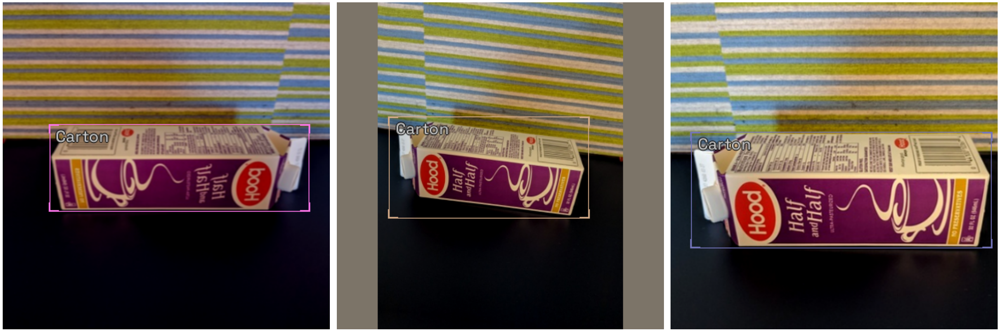

In [41]:
# Show an element of the train_ds with augmentation transformations applied
samples = [train_ds[0] for _ in range(3)]
show_samples(samples, ncols=3)

#Selecting a Library and a Model
>It is time to select our model ! We have a lot of options but I recommend you to try one of the mmdetection library models because they have a lot of state of the art implementations of models(Especially Vfnet).

#Creating a model
'Selections only take two simple lines of code. For example, to try the mmdet library using the retinanet model and the resnet50_fpn_1x backbone could be specified by:

model_type = models.mmdet.retinanet
backbone = model_type.backbones.resnet50_fpn_1x(pretrained=True)
As pretrained models are used by default, we typically leave this out of the backbone creation step.'

In [42]:
# Just change the value of selection to try another model

selection = 0

extra_args = {}

if selection == 0:
  model_type = models.mmdet.vfnet
  backbone = model_type.backbones.resnet50_fpn_mstrain_2x

if selection == 1:
  model_type = models.mmdet.retinanet
  backbone = model_type.backbones.resnet50_fpn_1x
  # extra_args['cfg_options'] = { 
  #   'model.bbox_head.loss_bbox.loss_weight': 2,
  #   'model.bbox_head.loss_cls.loss_weight': 0.8,
  #    }

if selection == 2:
  model_type = models.mmdet.faster_rcnn
  backbone = model_type.backbones.resnet101_fpn_2x
  # extra_args['cfg_options'] = { 
  #   'model.roi_head.bbox_head.loss_bbox.loss_weight': 2,
  #   'model.roi_head.bbox_head.loss_cls.loss_weight': 0.8,
  #    }

if selection == 3:
  model_type = models.mmdet.ssd
  backbone = model_type.backbones.ssd300

if selection == 4:
  model_type = models.mmdet.yolox
  backbone = model_type.backbones.yolox_s_8x8

if selection == 5:
  model_type = models.mmdet.yolof
  backbone = model_type.backbones.yolof_r50_c5_8x8_1x_coco

if selection == 6:
  model_type = models.mmdet.detr
  backbone = model_type.backbones.r50_8x2_150e_coco

if selection == 7:
  model_type = models.mmdet.deformable_detr
  backbone = model_type.backbones.twostage_refine_r50_16x2_50e_coco

if selection == 8:
  model_type = models.mmdet.fsaf
  backbone = model_type.backbones.x101_64x4d_fpn_1x_coco

if selection == 9:
  model_type = models.mmdet.sabl
  backbone = model_type.backbones.r101_fpn_gn_2x_ms_640_800_coco

if selection == 10:
  model_type = models.mmdet.centripetalnet
  backbone = model_type.backbones.hourglass104_mstest_16x6_210e_coco

elif selection == 11:
  # The Retinanet model is also implemented in the torchvision library
  model_type = models.torchvision.retinanet
  backbone = model_type.backbones.resnet50_fpn

elif selection == 12:
  model_type = models.ross.efficientdet
  backbone = model_type.backbones.tf_lite0
  # The efficientdet model requires an img_size parameter
  extra_args['img_size'] = image_size

elif selection == 13:
  model_type = models.ultralytics.yolov5
  backbone = model_type.backbones.small
  # The yolov5 model requires an img_size parameter
  extra_args['img_size'] = image_size

model_type, backbone, extra_args

(<module 'icevision.models.mmdet.models.vfnet' from '/usr/local/lib/python3.7/dist-packages/icevision/models/mmdet/models/vfnet/__init__.py'>,
 {})

In [43]:
#collapse-hide
backbone.__dict__

{'config_path': Path('/root/.icevision/mmdetection_configs/mmdetection_configs-2.20.1/configs/vfnet/vfnet_r50_fpn_mstrain_2x_coco.py'),
 'model_name': 'vfnet',
 'pretrained': True,
 'weights_url': 'https://download.openmmlab.com/mmdetection/v2.0/vfnet/vfnet_r50_fpn_mstrain_2x_coco/vfnet_r50_fpn_mstrain_2x_coco_20201027-7cc75bd2.pth'}

In [44]:
#collapse-output
# Instantiate the model
model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(parser.class_map), **extra_args) 

/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/builder.py:17: UserWarning: ``build_anchor_generator`` would be deprecated soon, please use ``build_prior_generator`` 
  '``build_anchor_generator`` would be deprecated soon, please use '
2022-08-07 16:50:58,618 - mmcv - INFO - initialize ResNet with init_cfg {'type': 'Pretrained', 'checkpoint': 'torchvision://resnet50'}
2022-08-07 16:50:58,620 - mmcv - INFO - load model from: torchvision://resnet50
2022-08-07 16:50:58,621 - mmcv - INFO - load checkpoint from torchvision path: torchvision://resnet50
2022-08-07 16:50:58,731 - mmcv - WARNING - The model and loaded state dict do not match exactly

unexpected key in source state_dict: fc.weight, fc.bias

2022-08-07 16:50:58,763 - mmcv - INFO - initialize FPN with init_cfg {'type': 'Xavier', 'layer': 'Conv2d', 'distribution': 'uniform'}
2022-08-07 16:50:58,795 - mmcv - INFO - initialize VFNetHead with init_cfg {'type': 'Normal', 'layer': 'Conv2d', 'std': 0.01, 'override': {'type': 'No

load checkpoint from local path: checkpoints/vfnet/vfnet_r50_fpn_mstrain_2x_coco_20201027-7cc75bd2.pth
The model and loaded state dict do not match exactly

size mismatch for bbox_head.vfnet_cls.weight: copying a param with shape torch.Size([80, 256, 3, 3]) from checkpoint, the shape in current model is torch.Size([4, 256, 3, 3]).
size mismatch for bbox_head.vfnet_cls.bias: copying a param with shape torch.Size([80]) from checkpoint, the shape in current model is torch.Size([4]).


#Data Loader
>'The Data Loader is specific to a model_type. The job of the data loader is to get items from a dataset and batch them up in the specific format required by each model. This is why creating the data loaders is separated from creating the datasets.
We can take a look at the first batch of items from the valid_dl. Remember that the valid_tfms only resized (with padding) and normalized records, so different images, for example, are not returned each time. This is important to provide consistent validation during training'

In [45]:
# Data Loaders
train_dl = model_type.train_dl(train_ds, batch_size=8, num_workers=4, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=8, num_workers=4, shuffle=False)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


#Let's visualize a batch of images.

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


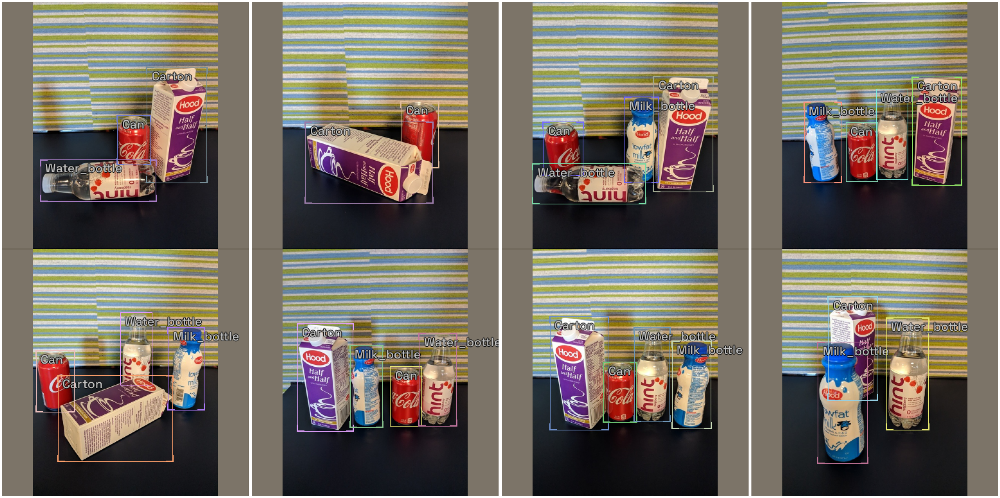

In [46]:
# show batch
model_type.show_batch(first(valid_dl), ncols=4)

#Metrics
>'The fastai and pytorch lightning engines collect metrics to track progress during training. IceVision provides metric classes that work across the engines and libraries.
The same metrics can be used for both fastai and pytorch lightning.'

In [47]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

#Training
>IceVision is an agnostic framework meaning it can be plugged into other DL learning engines such as fastai, and pytorch-lightning.This makes it so convenient and easy to train models.This also means we can use specific engines' callback systems.

#Training using fastai

In [48]:
learn = model_type.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)

/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


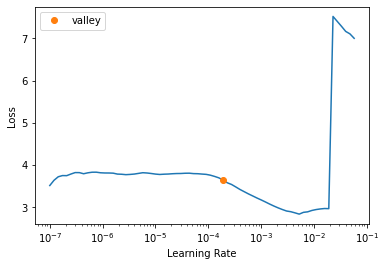

In [49]:
lr = learn.lr_find()[0]

In [50]:
#collapse-hide
lr

0.00019054606673307717

In [51]:
learn.fine_tune(20, lr, freeze_epochs=1)

epoch,train_loss,valid_loss,COCOMetric,time
0,3.595542,2.214065,0.419581,00:09


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


epoch,train_loss,valid_loss,COCOMetric,time
0,2.084602,1.634030,0.470653,00:10
1,1.858727,1.432253,0.444948,00:10
2,1.676041,1.159493,0.714662,00:10
3,1.521851,1.004197,0.796917,00:10
4,1.398202,0.944683,0.839429,00:10
5,1.288910,0.837564,0.897281,00:10
6,1.186669,0.767936,0.898159,00:10
7,1.098148,0.754201,0.922980,00:10
8,1.030176,0.718864,0.897819,00:10
9,0.975276,0.705527,0.907615,00:10


#Training with pytorch lightning is extremely easy aswell.
>Uncomment below lines to train with lightning.

In [53]:
#collapse-hide
# class LightModel(model_type.lightning.ModelAdapter):
#   def configure_optimizers(self):
#     return Adam(self.parameters(), lr=1e-4)  
# light_model = LightModel(model, metrics=metrics)
# trainer = pl.Trainer(max_epochs=5, gpus=1)
# trainer.fit(light_model, train_dl, valid_dl)

#Showing Results
>'The first step in reviewing the model is to show results from the validation dataset. This is easy to do with the show_results function.'

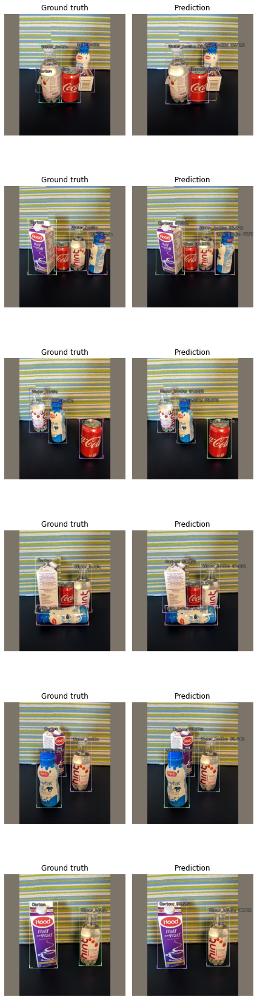

In [54]:
model_type.show_results(model, valid_ds, detection_threshold=0.5)

#Prediction
'Sometimes you want to have more control than show_results provides. You can construct an inference dataloader using infer_dl from any IceVision dataset and pass this to predict_dl and use show_preds to look at the predictions.

A prediction is returned as a dict with keys: scores, labels, bboxes, and possibly masks.

Prediction functions that take a detection_threshold argument will only return the predictions whose score is above the threshold.

Prediction functions that take a keep_images argument will only return the (tensor representation of the) image when it is True. In interactive environments, such as a notebook, it is helpful to see the image with bounding boxes and labels applied. In a deployment context, however, it is typically more useful (and efficient) to return the bounding boxes by themselves.'

In [55]:
infer_dl = model_type.infer_dl(valid_ds, batch_size=4, shuffle=False)
preds = model_type.predict_from_dl(model, infer_dl, keep_images=True)

  0%|          | 0/7 [00:00<?, ?it/s]

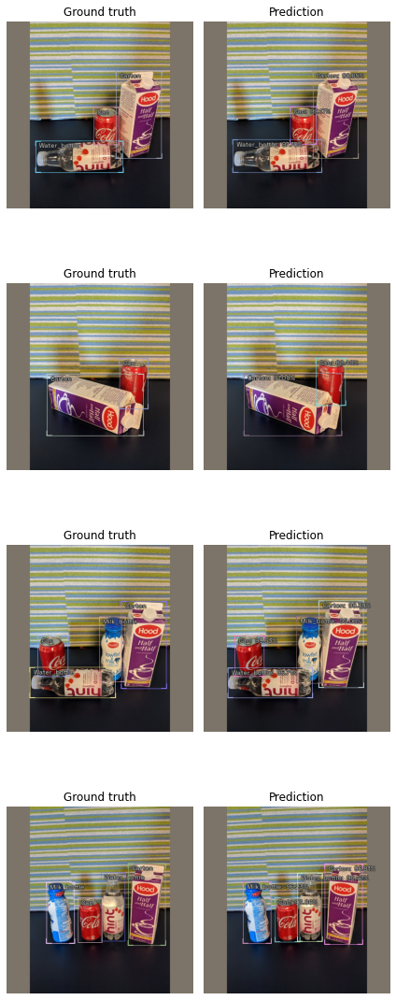

In [56]:
show_preds(preds=preds[:4])

#Saving Our Model
>For saving our model we need to import 'from icevision.models import *'.

In [57]:
from icevision.models import * 

In [60]:
# The model is automatically recreated in the evaluation mode. To unset that mode, you only need to pass `eval_mode=False`)
checkpoint_path = "/content/FridgeObjectsVfnet-ckpt.pth" #Path to save our model with model name
checkpoint_and_model = save_icevision_checkpoint(model, #our trained model
    filename = checkpoint_path, 
    model_name='mmdet.vfnet', #our model name 
    backbone_name='resnet50_fpn_mstrain_2x', #our model's backbone
    img_size=384, #our image size
    classes =  parser.class_map.get_classes() #our classnames
    )

#Loading Our Model

In [ ]:
#collapse-output
checkpoint_path = '/content/FridgeObjectsVfnet-ckpt.pth'

checkpoint_and_model = model_from_checkpoint(checkpoint_path)
# Just logging the info
model_type = checkpoint_and_model["model_type"]
backbone = checkpoint_and_model["backbone"] 
class_map = checkpoint_and_model["class_map"] #our classes
img_size = checkpoint_and_model["img_size"] #our image size
model_type, backbone, class_map, img_size

In [63]:
model = checkpoint_and_model["model"]
# Transforms
img_size = checkpoint_and_model["img_size"]
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(img_size), tfms.A.Normalize()]) 

#Single Image Inference

In [118]:
#hide-output
!wget https://img.merkandi.com.tr/imgcache/800x600/offer/whatsapp-image-2022-04-18-at-100915-1650299189-1650299201.jpeg #lets grab an image from google

--2022-08-07 17:58:00--  https://img.merkandi.com.tr/imgcache/800x600/offer/whatsapp-image-2022-04-18-at-100915-1650299189-1650299201.jpeg
Resolving img.merkandi.com.tr (img.merkandi.com.tr)... 89.40.147.162
Connecting to img.merkandi.com.tr (img.merkandi.com.tr)|89.40.147.162|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 40986 (40K) [image/jpeg]
Saving to: ‘whatsapp-image-2022-04-18-at-100915-1650299189-1650299201.jpeg’

whatsapp-image-2022 100%[===================>]  40.03K   190KB/s    in 0.2s    

2022-08-07 17:58:01 (190 KB/s) - ‘whatsapp-image-2022-04-18-at-100915-1650299189-1650299201.jpeg’ saved [40986/40986]



In [119]:
image = PIL.Image.open("/content/whatsapp-image-2022-04-18-at-100915-1650299189-1650299201.jpeg")

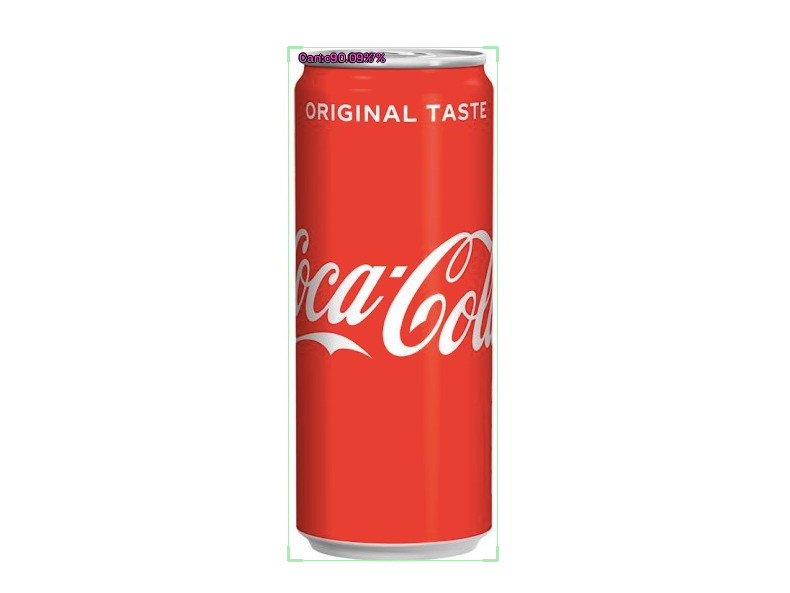

In [120]:
pred_dict  = model_type.end2end_detect(image, valid_tfms, model, class_map=class_map, detection_threshold=0.5) #don't forget to play with detection_threshold !
pred_dict['img']

#Batch Inference

In [130]:
infer_ds = Dataset.from_images([image for i in range(4)], valid_tfms, class_map=class_map) #our image repeated four times
infer_dl = model_type.infer_dl(infer_ds , batch_size=4, shuffle=False)
preds = model_type.predict_from_dl(model, infer_dl, keep_images=True)

  0%|          | 0/1 [00:00<?, ?it/s]

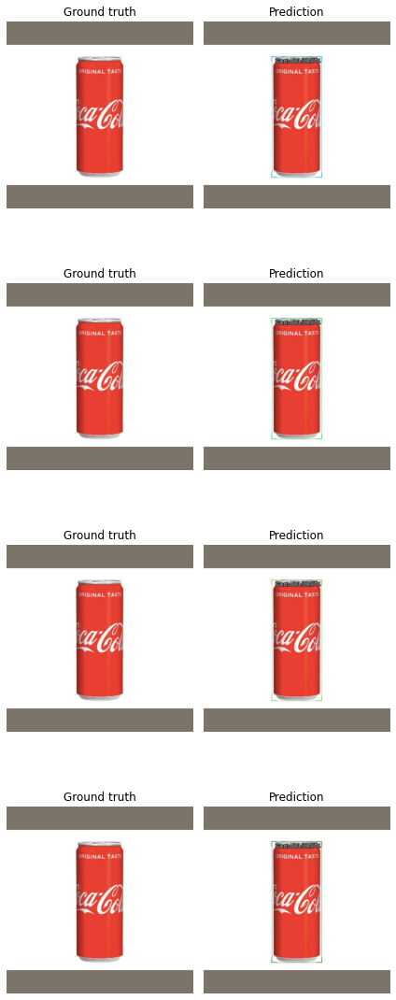

In [132]:
show_preds(preds=preds[0:4])